<a href="https://colab.research.google.com/github/Asifr001/Machine_Learning_Health_Care/blob/main/Machine_Learning_Suicide_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import re

In [ ]:
from google.colab import files
uploaded=files.upload()


Saving df12.xlsx to df12.xlsx


In [ ]:
import io
df12= pd.read_excel(io.BytesIO(uploaded['df12.xlsx']))

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.svm import SVC  # Support Vector Machine
from sklearn.tree import DecisionTreeClassifier  # Decision Tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score


In [ ]:
import pandas as pd
from pylab import rcParams
import seaborn as sb
from scipy.stats.stats import kendalltau

<ipython-input-5-a343f470456f>:4: DeprecationWarning: Please use `kendalltau` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import kendalltau


In [ ]:
df13=df12.drop(['Q30_1','Q30_2','Q30_3'],1)

<ipython-input-6-b8437e92fb89>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df13=df12.drop(['Q30_1','Q30_2','Q30_3'],1)


# ***Real Data***

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
# Assuming df13 is your DataFrame with the features and df12 contains the target columns

# List of target columns
target_columns = ['Q27', 'Q28', 'Q29']

# Prepare the features (excluding the target columns)
X = df13.drop(target_columns, axis=1)

# Normalizing the data
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Dictionary to store the models and their results for each target
models_normalized = {}

# Split the data into training and testing sets (common for all models)
X_train, X_test, _, _ = train_test_split(X, X, test_size=0.2, random_state=42)
X_train_normalized, X_test_normalized, _, _ = train_test_split(X_normalized, X_normalized, test_size=0.2, random_state=42)

for target in target_columns:
    # Prepare the target data for the current model
    y = df12[target]
    y_train, y_test = train_test_split(y, test_size=0.2, random_state=42)

    # Initialize a dictionary to store results for each model
    results_normalized = {}

    # List of models to evaluate
    models_list = [
        RandomForestClassifier(random_state=42),
        DecisionTreeClassifier(random_state=42),
        LogisticRegression(random_state=42),
        KNeighborsClassifier(),
        SVC(random_state=42),
        XGBClassifier(random_state=42)
    ]

    model_names = ["RandomForest", "DecisionTree", "LogisticRegression", "KNN", "SVC", "XGBoost"]

    for model, name in zip(models_list, model_names):
        # Train and evaluate each model on normalized data
        model.fit(X_train_normalized, y_train)
        y_pred = model.predict(X_test_normalized)
        accuracy = accuracy_score(y_test, y_pred)
        report = classification_report(y_test, y_pred)

        # Store results
        results_normalized[name] = {"Accuracy": accuracy, "ClassificationReport": report}

    # Store the results in the models_normalized dictionary
    models_normalized[target] = results_normalized

# Now, models_normalized contains the results for the normalized data


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

In [ ]:
# Extracting and printing classification reports for target 'Q29'
for model_name in models_normalized['Q29']:
    print(f"Classification Report for {model_name} on target Q29:")
    print(models_normalized['Q29'][model_name]['ClassificationReport'])
    print("\n")


Classification Report for RandomForest on target Q29:
              precision    recall  f1-score   support

           0       0.92      0.99      0.96      1145
           1       0.78      0.23      0.35       124

    accuracy                           0.92      1269
   macro avg       0.85      0.61      0.65      1269
weighted avg       0.91      0.92      0.90      1269



Classification Report for DecisionTree on target Q29:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1145
           1       0.35      0.36      0.36       124

    accuracy                           0.87      1269
   macro avg       0.64      0.65      0.64      1269
weighted avg       0.87      0.87      0.87      1269



Classification Report for LogisticRegression on target Q29:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      1145
           1       0.65      0.37      0.47       124

    accura

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def extract_recall_class_1(report):
    lines = report.split('\n')
    for line in lines:
        if line.startswith('1'):
            return float(line.split()[3])
    return None


# ***Q29_ATTEMPT***

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Assuming df13 is your DataFrame with the features and df12 contains the targets
X = df13.drop(target_columns, axis=1)

# Normalizing the data
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Split the normalized data into training and testing sets (common for all models)
X_train_normalized, X_test_normalized, _, _ = train_test_split(X_normalized, X_normalized, test_size=0.2, random_state=42)

# Prepare the target data for the target 'Q27'
y_Q27 = df13['Q29']

# Split the target data 'Q27' into training and testing sets
y_train_Q27, y_test_Q27 = train_test_split(y_Q27, test_size=0.2, random_state=42)

# Now, X_train_normalized, X_test_normalized, y_train_Q27, and y_test_Q27 are ready for training and testing your model for target 'Q27'.


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the model using the training data
rf_classifier.fit(X_train_normalized, y_train_Q27)

# Predict on the test data
y_pred_Q27 = rf_classifier.predict(X_test_normalized)

# Evaluate the model
accuracy_Q27 = accuracy_score(y_test_Q27, y_pred_Q27)
classification_report_Q27 = classification_report(y_test_Q27, y_pred_Q27)

print("Accuracy on Q27:", accuracy_Q27)
print("Classification Report for Q27:")
print(classification_report_Q27)

# The model is now trained and evaluated on the target 'Q27'.


Accuracy on Q27: 0.9180457052797478
Classification Report for Q27:
              precision    recall  f1-score   support

           0       0.92      0.99      0.96      1145
           1       0.78      0.23      0.35       124

    accuracy                           0.92      1269
   macro avg       0.85      0.61      0.65      1269
weighted avg       0.91      0.92      0.90      1269



In [ ]:
import pandas as pd

# Convert X_train_normalized and X_test_normalized back to DataFrame to retain column names
X_train_normalized_df = pd.DataFrame(X_train_normalized, columns=df13.columns.drop(target_columns))
X_test_normalized_df = pd.DataFrame(X_test_normalized, columns=df13.columns.drop(target_columns))

# Concatenate X_train_normalized with y_train for target 'Q27'
train_df_27 = pd.concat([X_train_normalized_df, y_train_Q27.reset_index(drop=True)], axis=1)

# Now, train_df_27 is a DataFrame containing both features and target for training


# **CTGAN**

In [ ]:
pip install ctgan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.2/76.2 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 33.9 MB/s eta 0:00:00


In [ ]:
df13.isnull().sum()

Q1         0
Q2         0
Q3         0
Q4         0
Q6         0
          ..
Q89_2.0    0
Q89_3.0    0
Q90_1.0    0
Q90_2.0    0
Q90_3.0    0
Length: 170, dtype: int64

In [ ]:
df55=train_df_27.drop(['Q6','Q7'],1)

<ipython-input-13-048f7e8fcb7d>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df55=train_df_27.drop(['Q6','Q7'],1)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
from ctgan import CTGAN

In [ ]:
# Initial setup
df20 = train_df_27[train_df_27['Q29']==1]

In [ ]:
# Initial setup
df20 = train_df_27[train_df_27['Q29']==1]
focused_columns = df55.columns

In [ ]:
df20['Q29'].value_counts()

1    464
Name: Q29, dtype: int64

In [ ]:
train_df_27['Q29'].value_counts()

0    4612
1     464
Name: Q29, dtype: int64

In [ ]:
train_df_27.shape

(5076, 168)

In [ ]:


# Initial setup
df20 = train_df_27[train_df_27['Q29']==1]
focused_columns = df20.columns
ctgan = CTGAN(epochs=38)
# Lists to store results for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy']
classifiers = ['DecisionTree', 'RandomForest', 'SVM', 'LogisticRegression','KNN','XGBoost']
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
recall_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
    'KNN':[],
    'XGBoost':[]
}

# Run the process 25 times
for _ in range(15):
    # Train CTGAN model on transformed copula samples
    ctgan.fit(df20, focused_columns)

    # Create synthetic data
    synthetic_data = ctgan.sample(2650)

    # Concatenate the DataFrames
    df30 = pd.concat([train_df_27, synthetic_data], ignore_index=True)

    # Data for classifiers
    X = df30.drop('Q29', axis=1)
    y = df30['Q29']

    # Initialize classifiers
    classifiers = {
        'DecisionTree': DecisionTreeClassifier(random_state=42),
        'RandomForest': RandomForestClassifier(random_state=42),
        'SVM': SVC(random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42),
        'KNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(random_state=42)
    }

    for name, clf in classifiers.items():
        # Fit classifier
        clf.fit(X, y)

        # Evaluate classifier
        y_pred = clf.predict(X_test_normalized)
        report = classification_report(y_test_Q27, y_pred, output_dict=True)
        # Store metrics
        results[name]['recall'].append(report['weighted avg']['recall'])
        results[name]['precision'].append(report['weighted avg']['precision'])
        results[name]['f1-score'].append(report['weighted avg']['f1-score'])
        results[name]['accuracy'].append(accuracy_score(y_test_Q27, y_pred))
        # Store recall score of class 1
        recall_scores_class_1[name].append(report['1']['recall'])

# Now, recall_scores_class_1 dictionary contains the recall scores of class 1 for all models


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feat

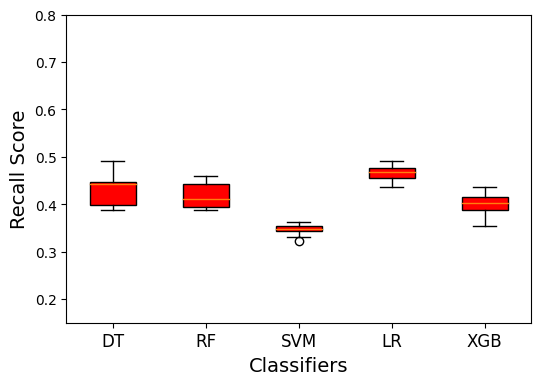

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        recall_scores_class_1['XGBoost']]

# Creating the boxplot
bp = ax.boxplot(data, patch_artist=True)

# Coloring the boxes blue
for box in bp['boxes']:
    box.set(facecolor='red')

# Setting the labels for each boxplot
ax.set_xticklabels(['DT', 'RF', 'SVM', 'LR', 'XGB'], fontsize=12)
ax.set_ylabel('Recall Score', fontsize=14)
ax.set_xlabel('Classifiers', fontsize=14)

# Setting y-axis limits and tick marks
ax.set_ylim(0.15, 0.80)
#ax.set_yticks([i * 0.2 for i in range(6)])

# Show the plot
plt.show()

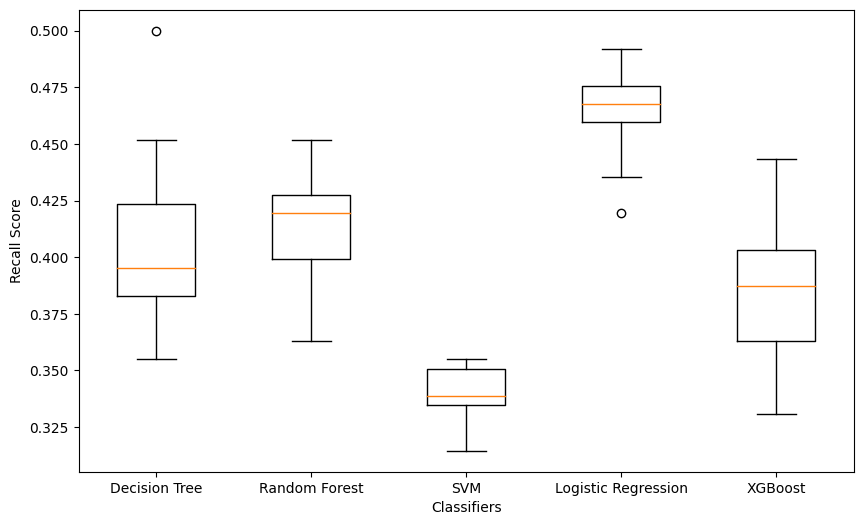

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        #recall_scores_class_1['KNN'],
        recall_scores_class_1['XGBoost']]
# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('Recall Score')
ax.set_xlabel('Classifiers')
#plt.savefig("recall_classs1_GAN.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


In [ ]:
synthetic_data.shape

(2650, 168)

In [ ]:
df30.shape

(7726, 168)

In [ ]:
df30['Q29'].value_counts()

0    4612
1    3114
Name: Q29, dtype: int64

In [ ]:
synthetic_data.to_csv("synthetic_data_gan29.csv", index=False)

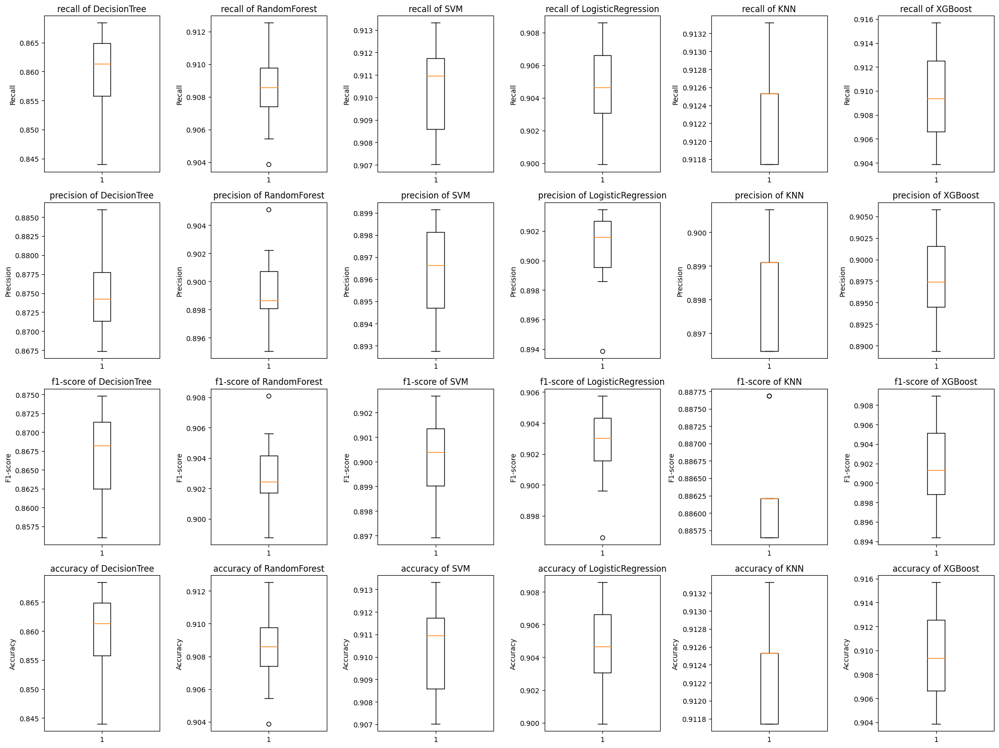

In [ ]:
fig, axes = plt.subplots(len(metrics), len(classifiers), figsize=(20, 15))
for i, metric in enumerate(metrics):
    for j, clf in enumerate(classifiers):
        axes[i, j].boxplot(results[clf][metric])
        axes[i, j].set_title(f'{metric} of {clf}')
        axes[i, j].set_ylabel(metric.capitalize())
plt.tight_layout()
plt.show()

# **SMOTE**

In [ ]:
resample = SMOTE(sampling_strategy=0.6752)
X = train_df_27.drop('Q29', axis=1)
y = train_df_27['Q29']
X_resampled, y_resampled = resample.fit_resample(X, y)
X_resampled.shape

(7726, 167)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from collections import Counter


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Assuming df13 is your DataFrame with the features and df12 contains the targets
X = df13.drop(target_columns, axis=1)

# Normalizing the data
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Split the normalized data into training and testing sets (common for all models)
X_train_normalized, X_test_normalized, _, _ = train_test_split(X_normalized, X_normalized, test_size=0.2, random_state=42)

# Prepare the target data for the target 'Q27'
y_Q27 = df13['Q29']

# Split the target data 'Q27' into training and testing sets
y_train_Q27, y_test_Q27 = train_test_split(y_Q27, test_size=0.2, random_state=42)


In [ ]:
import pandas as pd

# Convert X_train_normalized and X_test_normalized back to DataFrame to retain column names
X_train_normalized_df = pd.DataFrame(X_train_normalized, columns=df13.columns.drop(target_columns))
X_test_normalized_df = pd.DataFrame(X_test_normalized, columns=df13.columns.drop(target_columns))

# Concatenate X_train_normalized with y_train for target 'Q27'
train_df_27 = pd.concat([X_train_normalized_df, y_train_Q27.reset_index(drop=True)], axis=1)

In [ ]:
from sklearn.metrics import fbeta_score
from sklearn.metrics import fbeta_score
def calculate_f2_score(y_true, y_pred):
    """
    Calculate the F2 score, which gives twice as much weight to recall as to precision.

    Parameters:
    y_true: array-like of shape (n_samples,), True labels.
    y_pred: array-like of shape (n_samples,), Predicted labels.

    Returns:
    f2_score: F2 score of the model.
    """
    f2_score = fbeta_score(y_true, y_pred, beta=2)
    return f2_score

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from collections import Counter


# Define the resampling method
resample = SMOTE(sampling_strategy=0.6752)
X = train_df_27.drop('Q29', axis=1)
y = train_df_27['Q29']


# Lists to store results for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy']
classifiers = ['DecisionTree', 'RandomForest', 'SVM', 'LogisticRegression','KNN','XGBoost']
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy','f2-score']
# Initialize classifiers
classifiers = {
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'RandomForest': RandomForestClassifier(random_state=42),
    'SVM': SVC(random_state=42),
    'LogisticRegression': LogisticRegression(random_state=42),
    'KNN': KNeighborsClassifier(),
    'XGBoost': XGBClassifier(random_state=42)
}
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
recall_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
    'KNN':[],
    'XGBoost':[]
}
precision_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f1_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f2_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}


# Run the process 25 times
for _ in range(25):
    # Train CTGAN model on transformed copula samples
    X = train_df_27.drop('Q29', axis=1)
    y = train_df_27['Q29']
    X_resampled, y_resampled = resample.fit_resample(X, y)


    # Initialize classifiers
    classifiers = {
        'DecisionTree': DecisionTreeClassifier(random_state=42),
        'RandomForest': RandomForestClassifier(random_state=42),
        'SVM': SVC(random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42),
        'KNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(random_state=42)
    }

    for name, clf in classifiers.items():
        # Fit classifier
        clf.fit(X_resampled, y_resampled)

        # Evaluate classifier
        y_pred = clf.predict(X_test_normalized)
        report = classification_report(y_test_Q27, y_pred, output_dict=True)
        # Store metrics
        results[name]['recall'].append(report['weighted avg']['recall'])
        results[name]['precision'].append(report['weighted avg']['precision'])
        results[name]['f1-score'].append(report['weighted avg']['f1-score'])
        results[name]['accuracy'].append(accuracy_score(y_test_Q27, y_pred))
        results[name]['f2-score'].append(calculate_f2_score(y_test_Q27, y_pred))
        recall_scores_class_1[name].append(report['1']['recall'])
        precision_scores_class_1[name].append(report['1']['precision'])
        f1_scores_class_1[name].append(report['1']['f1-score'])

# Now, recall_scores_class_1 dictionary contains the recall scores of class 1 for all models


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-r

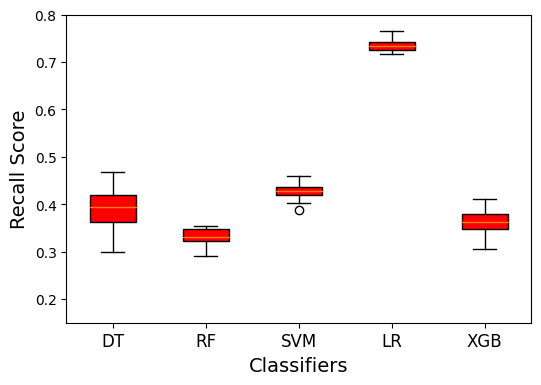

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        recall_scores_class_1['XGBoost']]

# Creating the boxplot
bp = ax.boxplot(data, patch_artist=True)

# Coloring the boxes blue
for box in bp['boxes']:
    box.set(facecolor='red')

# Setting the labels for each boxplot
ax.set_xticklabels(['DT', 'RF', 'SVM', 'LR', 'XGB'], fontsize=12)
ax.set_ylabel('Recall Score', fontsize=14)
ax.set_xlabel('Classifiers', fontsize=14)

# Setting y-axis limits and tick marks
ax.set_ylim(0.15, 0.80)
#ax.set_yticks([i * 0.2 for i in range(6)])

# Show the plot
plt.show()

In [ ]:
 X_resampled.shape

(7726, 167)

In [ ]:
df30.shape

(7726, 168)

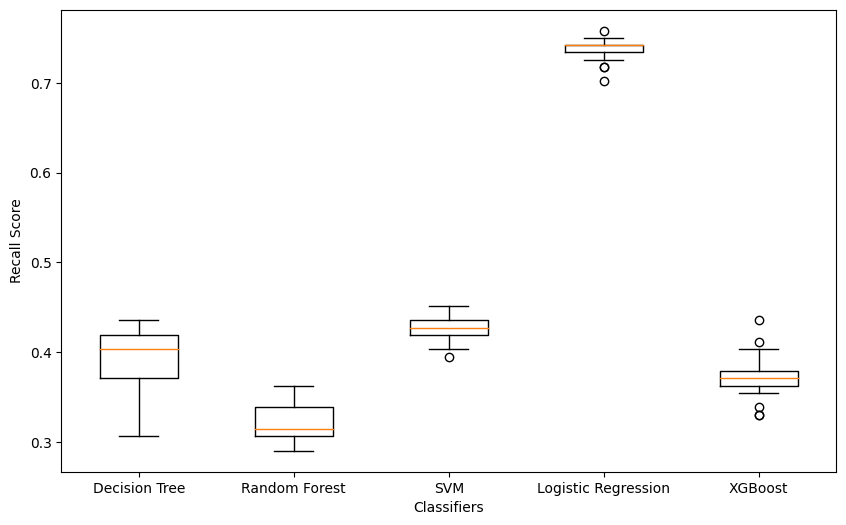

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        #recall_scores_class_1['KNN'],
        recall_scores_class_1['XGBoost']]
# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('Recall Score')
ax.set_xlabel('Classifiers')
#plt.savefig("recall_classs1_GAN.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from collections import Counter


# Define the resampling method
resample = SMOTE(sampling_strategy=0.6752)
X = train_df_27.drop('Q29', axis=1)
y = train_df_27['Q29']


# Lists to store results for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy']
classifiers = ['DecisionTree', 'RandomForest', 'SVM', 'LogisticRegression','KNN','XGBoost']
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy','f2-score']
# Initialize classifiers
classifiers = {
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'RandomForest': RandomForestClassifier(random_state=42),
    'SVM': SVC(random_state=42),
    'LogisticRegression': LogisticRegression(random_state=42),
    'KNN': KNeighborsClassifier(),
    'XGBoost': XGBClassifier(random_state=42)
}
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
recall_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
    'KNN':[],
    'XGBoost':[]
}
precision_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f1_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f2_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
binary_columns = [col for col in train_df_27.columns if train_df_27[col].nunique() == 2 and col != 'Q29']
# Run the process 25 times
for _ in range(25):
    # Train CTGAN model on transformed copula samples
    X = train_df_27.drop('Q29', axis=1)
    y = train_df_27['Q29']
    X_resampled, y_resampled = resample.fit_resample(X, y)
    X_resampled_binary = X_resampled[binary_columns]
    X_resampled_binary = (X_resampled_binary > 0.50).astype(int)  # Convert to binary

    # Update the resampled DataFrame
    X_resampled.update(X_resampled_binary)

    # Initialize classifiers
    classifiers = {
        'DecisionTree': DecisionTreeClassifier(random_state=42),
        'RandomForest': RandomForestClassifier(random_state=42),
        'SVM': SVC(random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42),
        'KNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(random_state=42)
    }

    for name, clf in classifiers.items():
        # Fit classifier
        clf.fit(X_resampled, y_resampled)

        # Evaluate classifier
        y_pred = clf.predict(X_test_normalized)
        report = classification_report(y_test_Q27, y_pred, output_dict=True)
        # Store metrics
        results[name]['recall'].append(report['weighted avg']['recall'])
        results[name]['precision'].append(report['weighted avg']['precision'])
        results[name]['f1-score'].append(report['weighted avg']['f1-score'])
        results[name]['accuracy'].append(accuracy_score(y_test_Q27, y_pred))
        results[name]['f2-score'].append(calculate_f2_score(y_test_Q27, y_pred))
        recall_scores_class_1[name].append(report['1']['recall'])
        precision_scores_class_1[name].append(report['1']['precision'])
        f1_scores_class_1[name].append(report['1']['f1-score'])

# Now, recall_scores_class_1 dictionary contains the recall scores of class 1 for all models


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-r

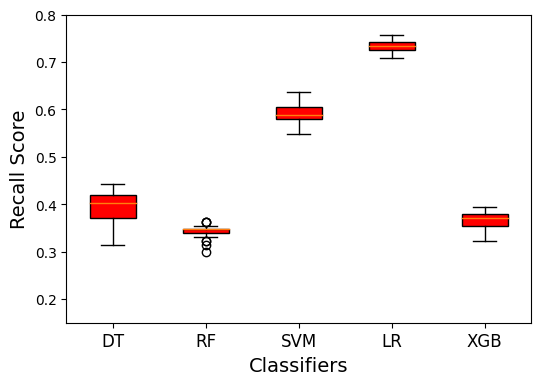

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        recall_scores_class_1['XGBoost']]

# Creating the boxplot
bp = ax.boxplot(data, patch_artist=True)

# Coloring the boxes blue
for box in bp['boxes']:
    box.set(facecolor='red')

# Setting the labels for each boxplot
ax.set_xticklabels(['DT', 'RF', 'SVM', 'LR', 'XGB'], fontsize=12)
ax.set_ylabel('Recall Score', fontsize=14)
ax.set_xlabel('Classifiers', fontsize=14)

# Setting y-axis limits and tick marks
ax.set_ylim(0.15, 0.80)
#ax.set_yticks([i * 0.2 for i in range(6)])

# Show the plot
plt.show()

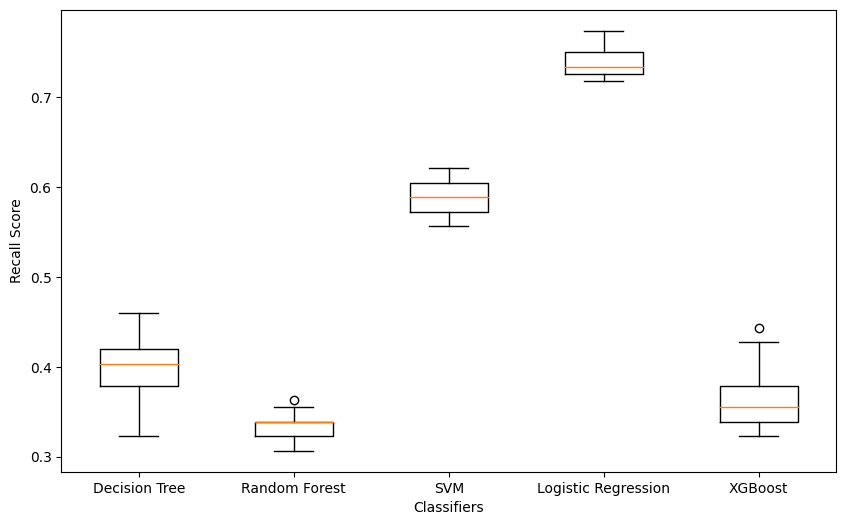

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        #recall_scores_class_1['KNN'],
        recall_scores_class_1['XGBoost']]
# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('Recall Score')
ax.set_xlabel('Classifiers')
#plt.savefig("recall_classs1_GAN.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


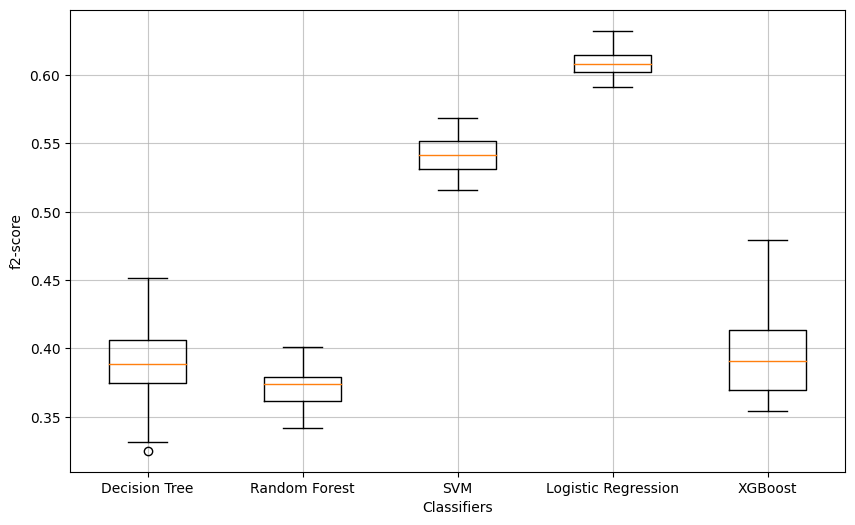

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [results['DecisionTree']['f2-score'],
        results['RandomForest']['f2-score'],
        results['SVM']['f2-score'],
        results['LogisticRegression']['f2-score'],
        #results['KNN']['f2-score'],
        results['XGBoost']['f2-score']]


# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('f2-score')
ax.set_xlabel('Classifiers')


ax.grid(True, linestyle='-', alpha=0.7)
#plt.savefig("recall_classs1_Binary_copula.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


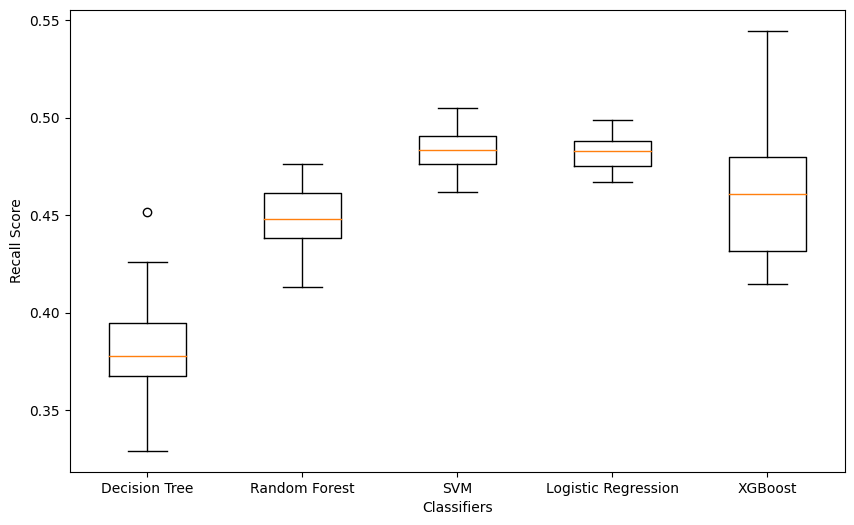

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [f1_scores_class_1['DecisionTree'],
        f1_scores_class_1['RandomForest'],
        f1_scores_class_1['SVM'],
        f1_scores_class_1['LogisticRegression'],
        #f1_scores_class_1['KNN'],
        f1_scores_class_1['XGBoost']]
# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('Recall Score')
ax.set_xlabel('Classifiers')
#plt.savefig("recall_classs1_GAN.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


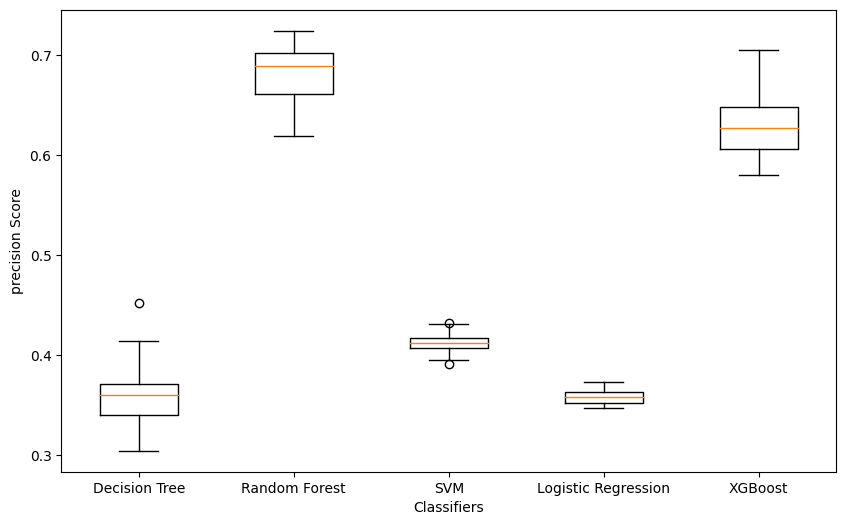

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [precision_scores_class_1['DecisionTree'],
        precision_scores_class_1['RandomForest'],
        precision_scores_class_1['SVM'],
        precision_scores_class_1['LogisticRegression'],
        #precision_scores_class_1['KNN'],
        precision_scores_class_1['XGBoost']]
# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('precision Score')
ax.set_xlabel('Classifiers')
#plt.savefig("recall_classs1_GAN.pdf", dpi=300, bbox_inches='tight')


# Show the plot
plt.show()


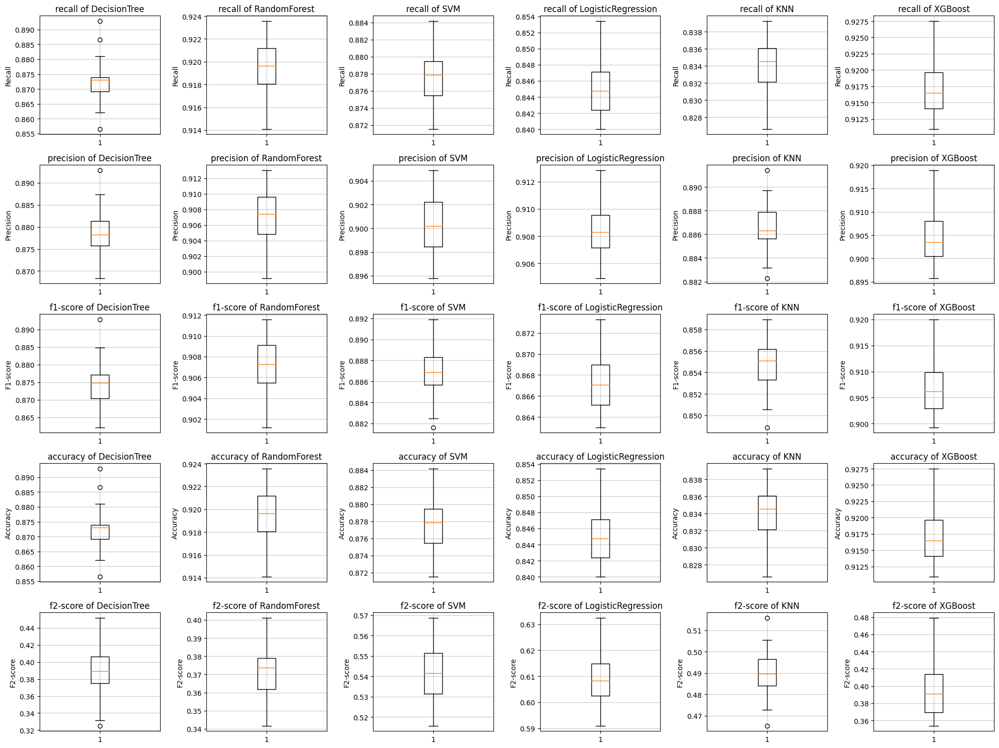

In [ ]:
fig, axes = plt.subplots(len(metrics), len(classifiers), figsize=(20, 15))
for i, metric in enumerate(metrics):
    for j, clf in enumerate(classifiers):
        axes[i, j].boxplot(results[clf][metric])
        axes[i, j].set_title(f'{metric} of {clf}')
        axes[i, j].set_ylabel(metric.capitalize())

# Adding grids to all subplots
for ax in axes.flatten():
    ax.grid(True, linestyle='-', alpha=0.7)

plt.tight_layout()
plt.show()

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from collections import Counter


# Define the resampling method
resample = SMOTE(sampling_strategy=0.6752)
X = train_df_27.drop('Q29', axis=1)
y = train_df_27['Q29']


# Lists to store results for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy']
classifiers = ['DecisionTree', 'RandomForest', 'SVM', 'LogisticRegression','KNN','XGBoost']
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy','f2-score']
# Initialize classifiers
classifiers = {
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'RandomForest': RandomForestClassifier(random_state=42),
    'SVM': SVC(random_state=42),
    'LogisticRegression': LogisticRegression(random_state=42),
    'KNN': KNeighborsClassifier(),
    'XGBoost': XGBClassifier(random_state=42)
}
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
recall_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
    'KNN':[],
    'XGBoost':[]
}
precision_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f1_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
f2_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
        'KNN':[],
    'XGBoost':[]
}
binary_columns = [col for col in train_df_27.columns if train_df_27[col].nunique() == 2 and col != 'Q29']
# Run the process 25 times
for _ in range(1):
    # Train CTGAN model on transformed copula samples
    X = train_df_27.drop('Q29', axis=1)
    y = train_df_27['Q29']
    X_resampled, y_resampled = resample.fit_resample(X, y)
    X_resampled_binary = X_resampled[binary_columns]
    X_resampled_binary = (X_resampled_binary > 0.50).astype(int)  # Convert to binary

    # Update the resampled DataFrame
    X_resampled.update(X_resampled_binary)

    # Initialize classifiers
    classifiers = {
        'DecisionTree': DecisionTreeClassifier(random_state=42),
        'RandomForest': RandomForestClassifier(random_state=42),
        'SVM': SVC(random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42),
        'KNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(random_state=42)
    }

    for name, clf in classifiers.items():
        # Fit classifier
        clf.fit(X_resampled, y_resampled)

        # Evaluate classifier
        y_pred = clf.predict(X_test_normalized)
        report = classification_report(y_test_Q27, y_pred, output_dict=True)
        # Store metrics
        results[name]['recall'].append(report['weighted avg']['recall'])
        results[name]['precision'].append(report['weighted avg']['precision'])
        results[name]['f1-score'].append(report['weighted avg']['f1-score'])
        results[name]['accuracy'].append(accuracy_score(y_test_Q27, y_pred))
        #results[name]['f2-score'].append(calculate_f2_score(y_test_Q27, y_pred))
        recall_scores_class_1[name].append(report['1']['recall'])
        precision_scores_class_1[name].append(report['1']['precision'])
        f1_scores_class_1[name].append(report['1']['f1-score'])

# Now, recall_scores_class_1 dictionary contains the recall scores of class 1 for all models


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-r

In [ ]:
import pandas as pd

# Assuming X_resample and y_resample are already defined
smote_df = pd.concat([X_resampled, y_resampled], axis=1)
smote_df=smote_df[-2650:]
smote_df

,Q1,Q2,Q3,Q4,Q6,Q7,Q8,Q9,Q10,Q11,...,Q70_2.0,Q70_3.0,Q70_4.0,Q89_1.0,Q89_2.0,Q89_3.0,Q90_1.0,Q90_2.0,Q90_3.0,Q29
5076,0.529454,1.0,0.044181,0.0,0.444792,0.272770,0.750000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1
5077,0.666667,1.0,0.457807,0.0,0.486388,0.497314,1.000000,0.084387,0.200000,0.142857,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1
5078,0.550779,1.0,0.076169,0.0,0.472923,0.404865,0.788084,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
5079,0.666667,0.0,0.261533,1.0,0.613279,0.319046,0.500000,0.273065,0.200000,0.441752,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1
5080,0.580570,1.0,0.129144,0.0,0.531330,0.299371,0.508289,0.241711,0.290054,0.483423,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7721,0.660922,1.0,0.370691,0.0,0.324518,0.372388,1.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
7722,0.796283,1.0,0.444424,0.0,0.382054,0.149719,1.000000,0.000000,0.200000,0.587256,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1
7723,0.642815,0.0,0.214223,0.0,0.551830,0.192060,0.714223,0.000000,0.085689,0.061207,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1
7724,0.500000,1.0,0.222481,1.0,0.523564,0.385973,0.777519,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1


In [ ]:
smote_df.to_csv("synthetic_data_smote29.csv", index=False)

In [ ]:
pip install table_evaluator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 2.8 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.0.3 which is incompatible.


In [ ]:
from table_evaluator import load_data, TableEvaluator

In [ ]:
table_evaluator = TableEvaluator(train_df_27, smote_df)

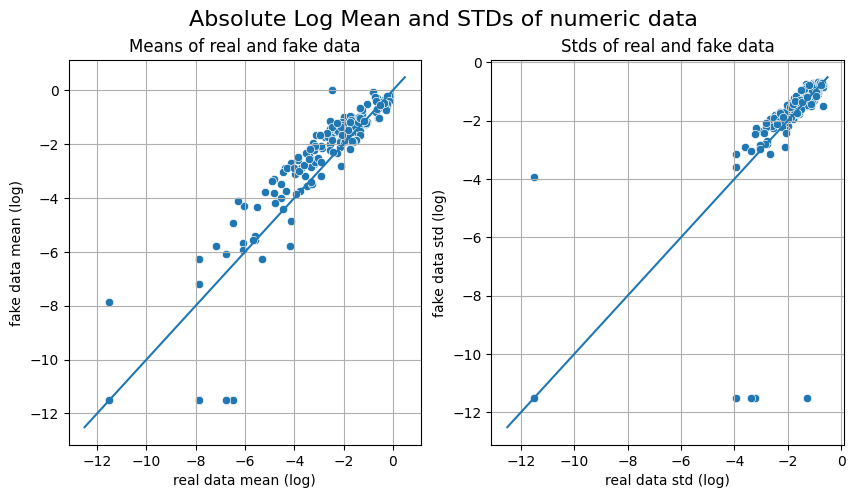

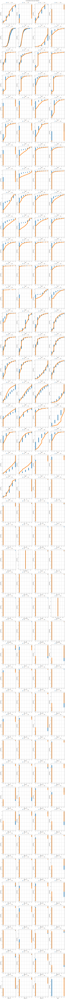

LinAlgError: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.

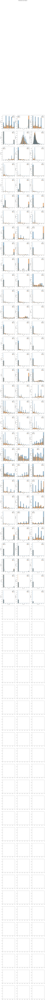

In [ ]:
table_evaluator.visual_evaluation()

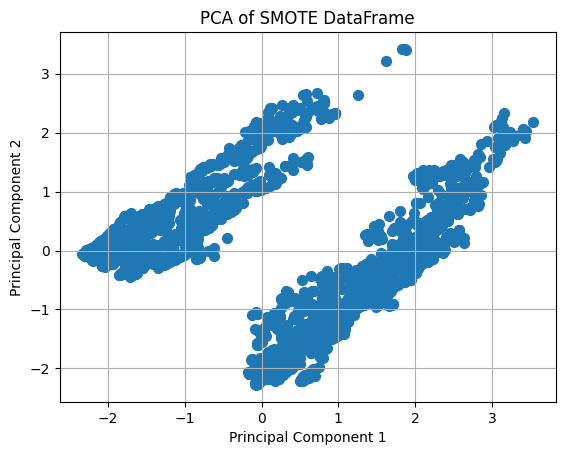

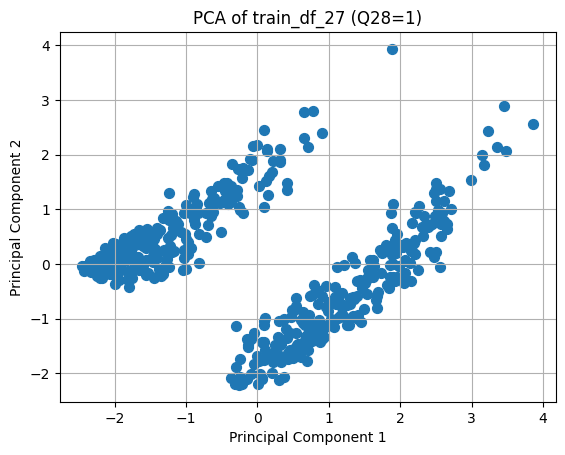

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pandas as pd

# Function to apply PCA and plot the first two components
def plot_pca(df, title):
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df)
    principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

    # Plotting
    plt.figure()
    plt.scatter(principal_df['PC1'], principal_df['PC2'], s=50)
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid()

# Apply PCA and plot for smote_df
plot_pca(smote_df, "PCA of SMOTE DataFrame")

# Filter train_df_27 where 'Q27' equals 1 and drop 'Q27' column
filtered_train_df_27 = train_df_27[train_df_27['Q29'] == 1].drop(columns=['Q29'])

# Apply PCA and plot for filtered train_df_27
plot_pca(filtered_train_df_27, "PCA of train_df_27 (Q28=1)")

plt.show()


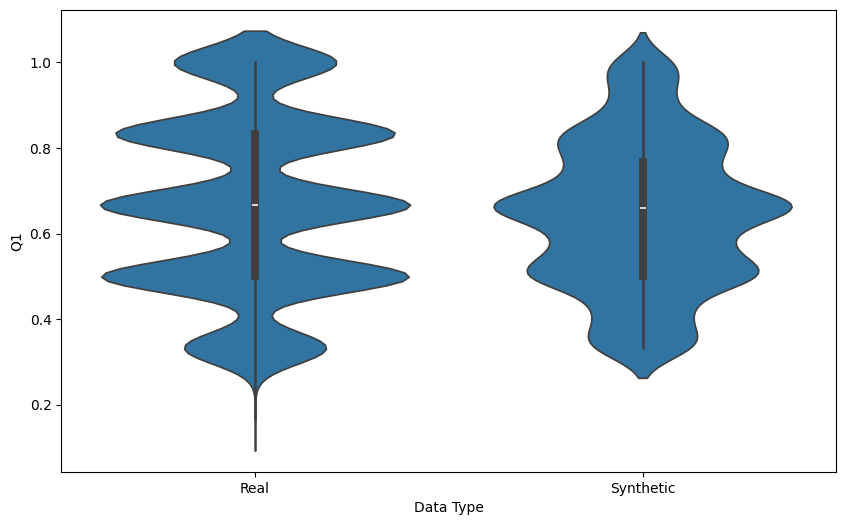

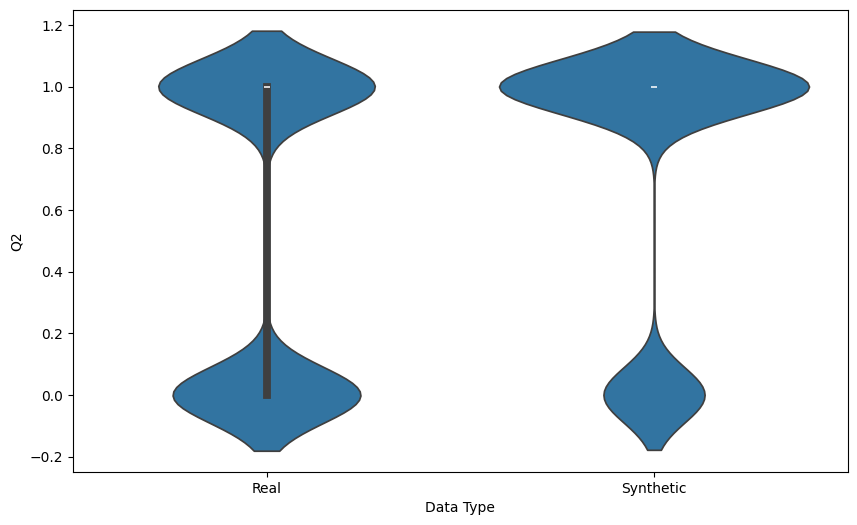

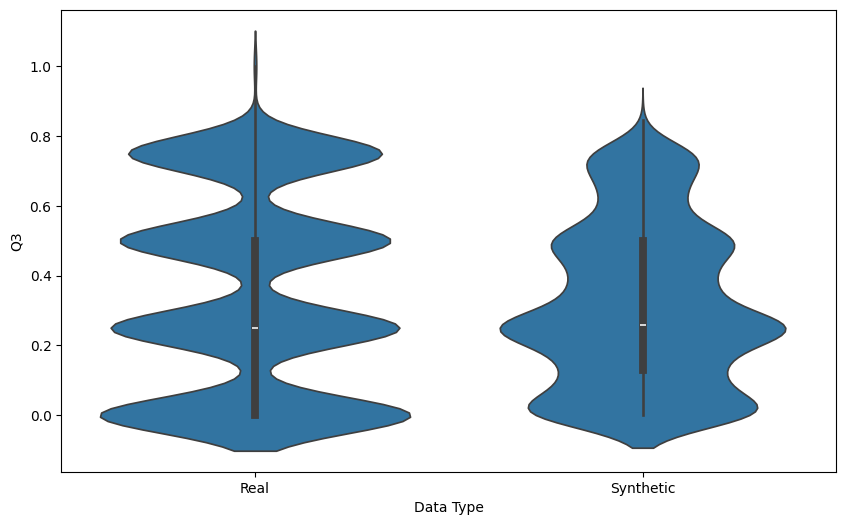

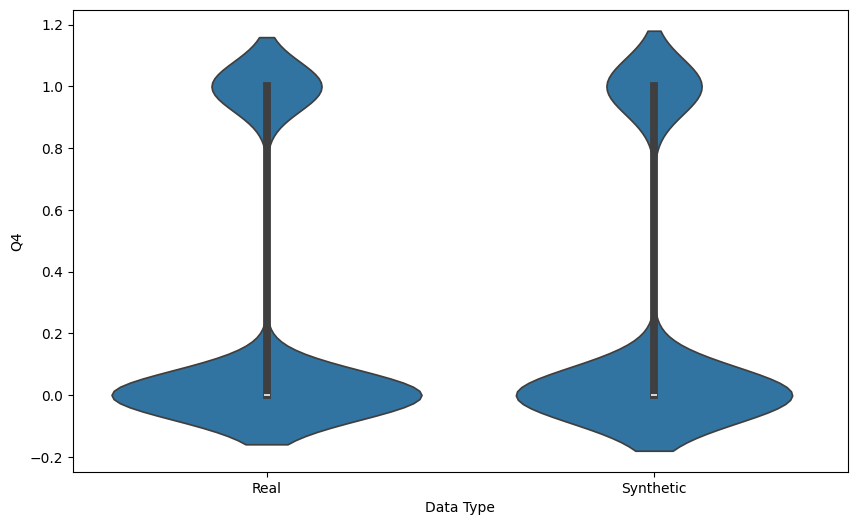

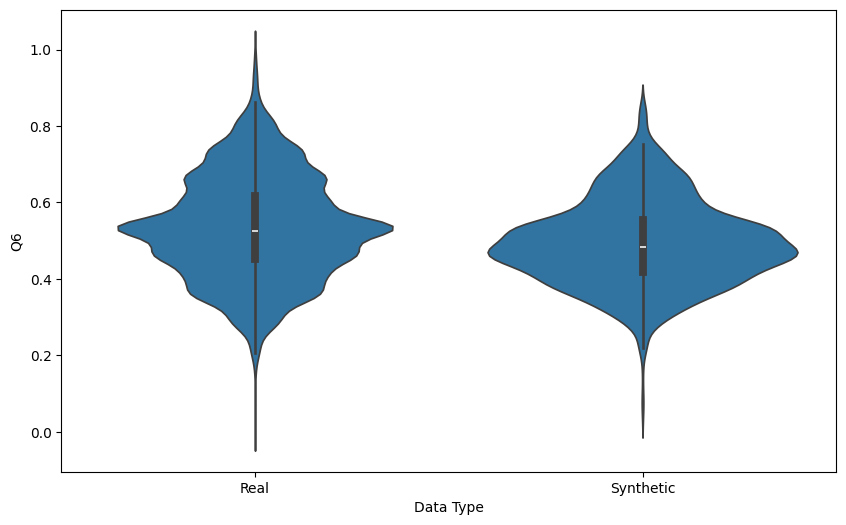

...

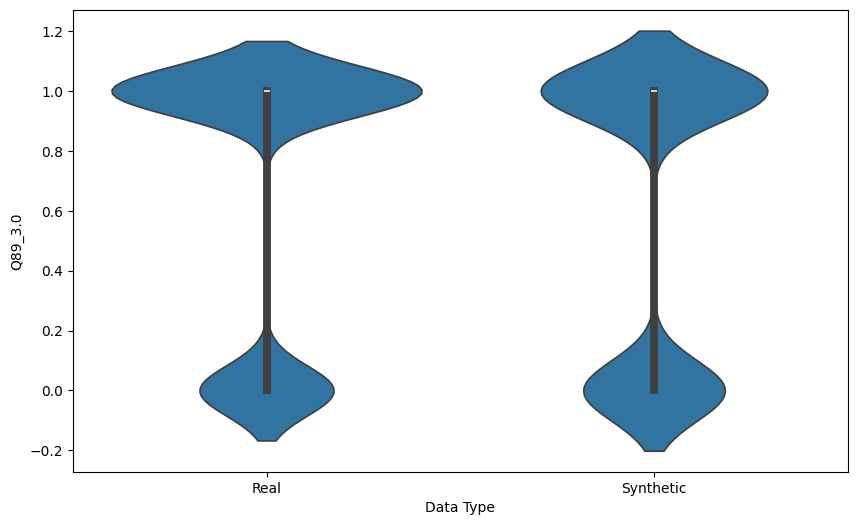

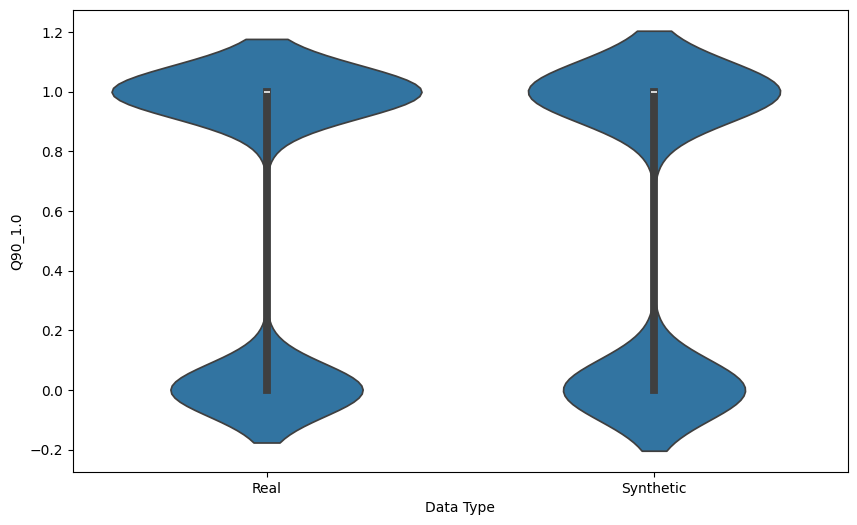

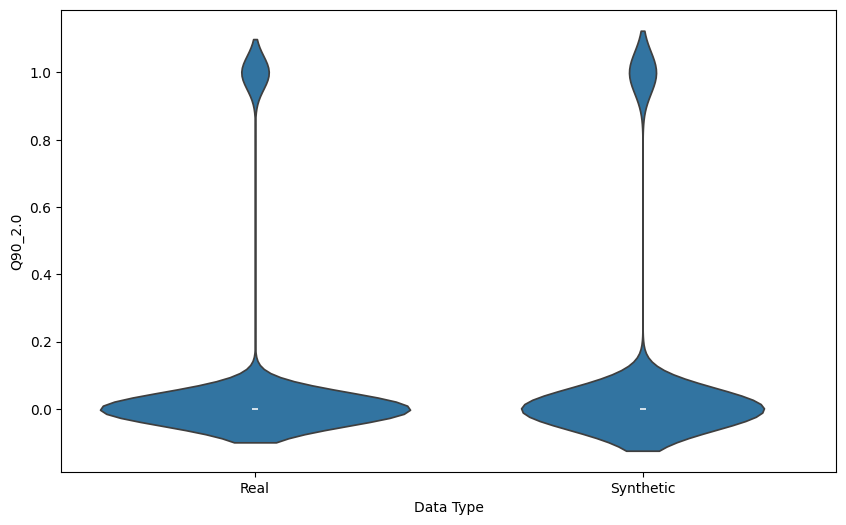

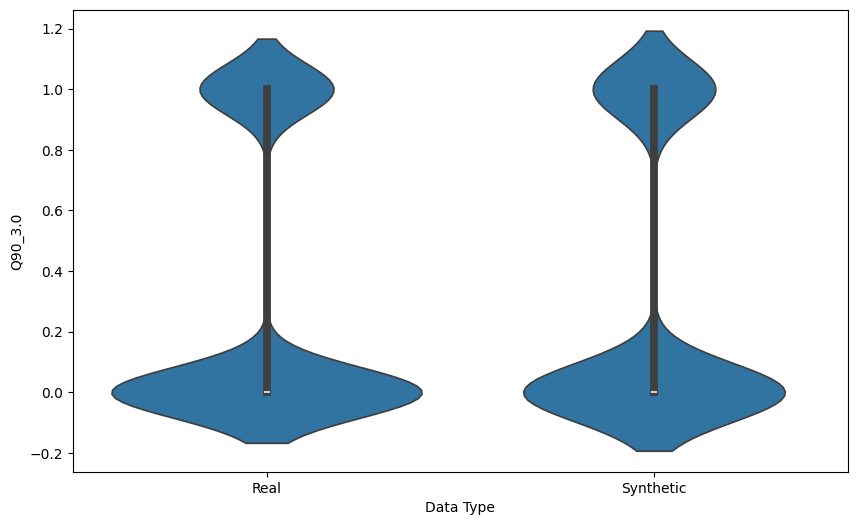

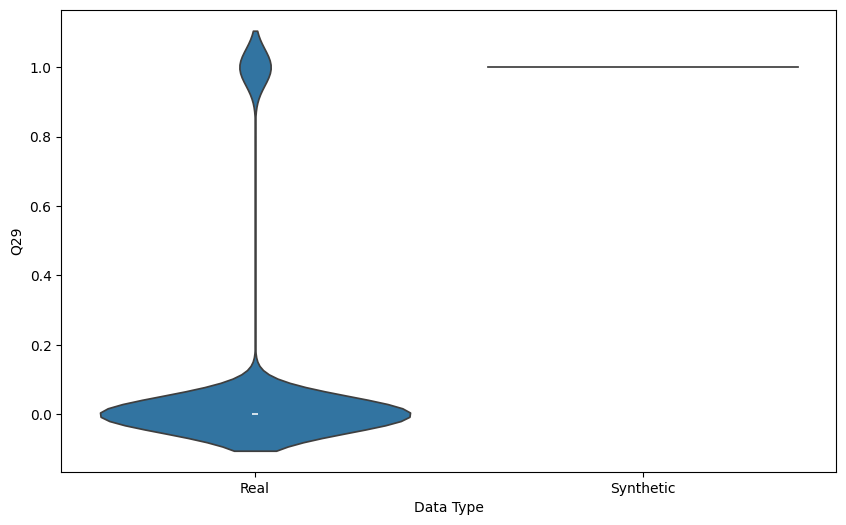

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'train_df' and 'synthetic_data' are your dataframes

# Add a column to distinguish between real and synthetic data
train_df_27['Type'] = 'Real'
smote_df['Type'] = 'Synthetic'

# Combine the datasets for easier plotting
combined_data = pd.concat([train_df_27, smote_df])

# List of features to plot (excluding the 'Type' column)
features = combined_data.drop('Type', axis=1).columns

# Create a violin plot for each feature
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='Type', y=feature, data=combined_data)
    #plt.title(f'{feature}')
    plt.ylabel(feature)
    plt.xlabel('Data Type')
    plt.show()


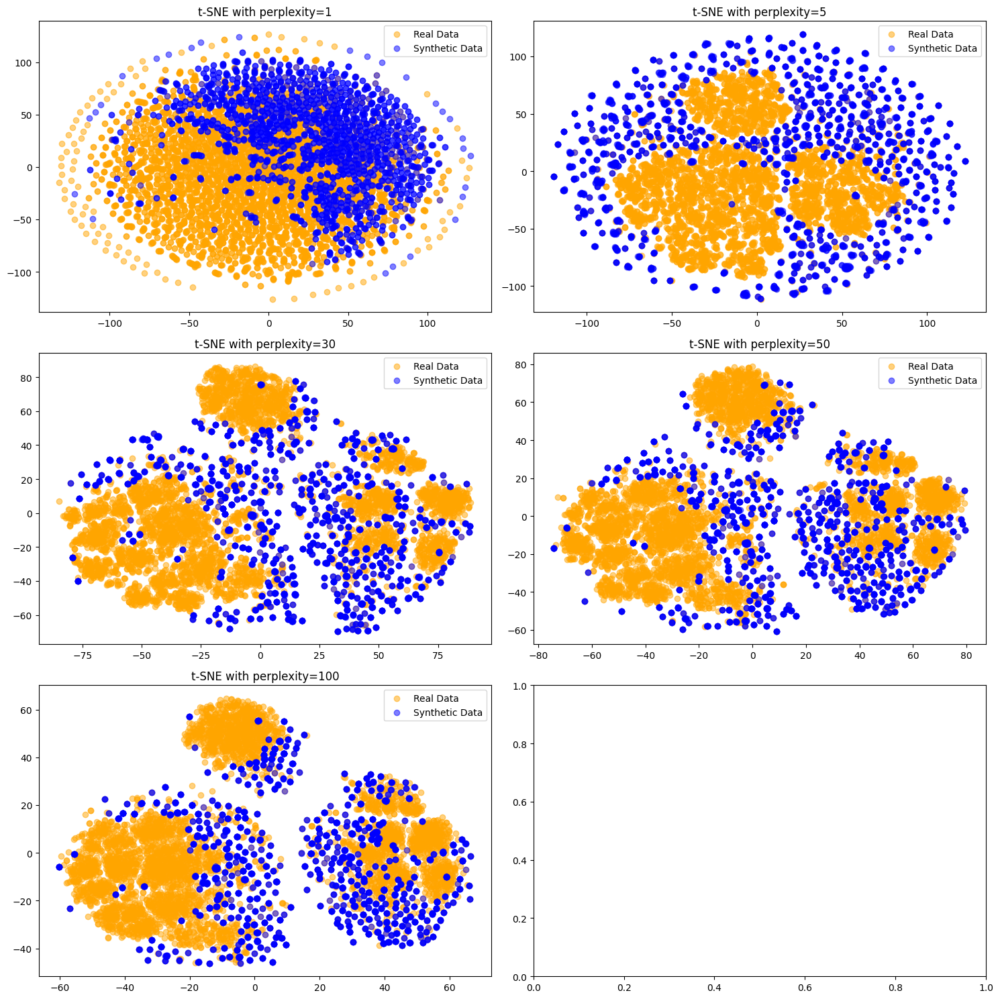

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have a DataFrame 'combined_data' with a 'Type' column distinguishing real and synthetic data

# Extract features and labels for t-SNE
features = combined_data.drop('Type', axis=1).values
labels = combined_data['Type'].values

# Set the perplexity values you want to test
perplexity_values = [1,5, 30, 50, 100]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
axes = axes.flatten()

for i, perplexity in enumerate(perplexity_values):
    # Apply t-SNE with the current perplexity
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    transformed_features = tsne.fit_transform(features)

    # Scatter plot
    axes[i].scatter(transformed_features[labels == 'Real', 0],
                    transformed_features[labels == 'Real', 1],
                    c='orange', label='Real Data', alpha=0.5)

    axes[i].scatter(transformed_features[labels == 'Synthetic', 0],
                    transformed_features[labels == 'Synthetic', 1],
                    c='blue', label='Synthetic Data', alpha=0.5)

    axes[i].legend()
    axes[i].set_title(f't-SNE with perplexity={perplexity}')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# List of target columns
target_columns = ['Q27', 'Q28', 'Q29']

# Prepare the features (excluding the target columns)
X = df13.drop(target_columns, axis=1)
y=df13['Q29']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

train_df_271 = pd.concat([X_train, y_train], axis=1)


In [ ]:
from sklearn.metrics import roc_auc_score

from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, fbeta_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# Assuming train_df_271, X_test, and y_test are defined
binary_columns = [col for col in train_df_271.columns if train_df_271[col].nunique() == 2 and col != 'Q29']
X = train_df_271.drop('Q29', axis=1)
y = train_df_271['Q29']

# Define different sampling strategies and class weights to try
sampling_strategies = [0.5,0.6,0.6752,0.7, 0.75,0.9,1]
class_weight_options = [ {0: 1, 1: 1},{0: 1, 1: 2},{0: 1, 1: 2.5},{0: 1, 1: 3},{0: 1, 1: 3.5},{0: 1, 1: 5},{0: 1, 1: 10}]

# Logistic Regression hyperparameters to tune
param_grid = {
    'C': [0.01, 0.1, 0.5, 1, 10, 100],
    'solver': ['lbfgs', 'liblinear']
}

# Number of features to select
num_features = 60  # Adjust this based on your requirement

# List to store results
results = []

for strategy in sampling_strategies:
    for class_weights in class_weight_options:
        print(f"\nSampling Strategy: {strategy}, Class Weights: {class_weights}")

        # Apply SMOTE with the current sampling strategy
        smote = SMOTE(sampling_strategy=strategy)
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Update binary columns in resampled data
        X_resampled_binary = X_resampled[binary_columns]
        X_resampled_binary = (X_resampled_binary > 0.5).astype(int)
        X_resampled.update(X_resampled_binary)

        # Apply RFE for feature selection
        estimator = LogisticRegression(random_state=42, class_weight=class_weights)
        selector = RFE(estimator, n_features_to_select=num_features)
        X_resampled_selected = selector.fit_transform(X_resampled, y_resampled)

        # Initialize and tune Logistic Regression with GridSearchCV
        clf = GridSearchCV(estimator, param_grid, scoring='f1')
        clf.fit(X_resampled_selected, y_resampled)

        # Best hyperparameters
        best_params = clf.best_params_
        print(f"Best Hyperparameters: {best_params}")

        # Apply the same feature selection to the test set
        X_test_selected = selector.transform(X_test)

        # Evaluate the classifier
        y_pred = clf.predict(X_test_selected)
        y_pred_proba = clf.predict_proba(X_test_selected)[:, 1]
        auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)
        f2_score = fbeta_score(y_test, y_pred, beta=2, average='binary')

        # Get the classification report
        report = classification_report(y_test, y_pred, output_dict=True)

        # Get the indices of the selected features
        selected_features_indices = selector.get_support(indices=True)
        selected_features = X.columns[selected_features_indices].tolist()

        # Store the results
        results.append({
            'Sampling Strategy': strategy,
            'Class Weights': class_weights,
            'Best Parameters': best_params,
            'Selected Features': selected_features,
            'Accuracy': accuracy,
            'Recall Class 0': report['0']['recall'],
            'Recall Class 1': report['1']['recall'],
            'Precision Class 0': report['0']['precision'],
            'Precision Class 1': report['1']['precision'],
            'F1 Score Class 0': report['0']['f1-score'],
            'F1 Score Class 1': report['1']['f1-score'],
            'F2 Score': f2_score,
            'AUC': auc
        })

        # Print results
        print(f"Accuracy: {accuracy}")
        print(f"F2 Score: {f2_score}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"AUC: {auc}")
# Convert the results list to a DataFrame
results_df29 = pd.DataFrame(results)



Sampling Strategy: 0.5, Class Weights: {0: 1, 1: 1}
Best Hyperparameters: {'C': 100, 'solver': 'liblinear'}
Accuracy: 0.9078014184397163
F2 Score: 0.29729729729729726
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      1145
           1       0.56      0.27      0.36       124

    accuracy                           0.91      1269
   macro avg       0.74      0.62      0.66      1269
weighted avg       0.89      0.91      0.89      1269

AUC: 0.8878926609381602

Sampling Strategy: 0.5, Class Weights: {0: 1, 1: 2}
Best Hyperparameters: {'C': 0.01, 'solver': 'lbfgs'}
Accuracy: 0.8912529550827423
F2 Score: 0.5201863354037267
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1145
           1       0.45      0.54      0.49       124

    accuracy                           0.89      1269
   macro avg       0.70      0.73      0.72      1269

In [ ]:
results_df29.to_csv("result29.csv", index=False)

In [ ]:
results_df29

,Sampling Strategy,Class Weights,Best Parameters,Selected Features,Accuracy,Recall Class 0,Recall Class 1,Precision Class 0,Precision Class 1,F1 Score Class 0,F1 Score Class 1,F2 Score,AUC
0,0.5000,"{0: 1, 1: 1}","{'C': 100, 'solver': 'liblinear'}","[Q6, Q19, Q24, Q26, Q98, Q5_ E, Q5_ D, Q5...",0.907801,0.977293,0.266129,0.924793,0.559322,0.950318,0.360656,0.297297,0.887893
1,0.5000,"{0: 1, 1: 2}","{'C': 0.01, 'solver': 'lbfgs'}","[Q6, Q19, Q26, Q98, Q5_ E, Q5_ D, Q5_ D...",0.891253,0.929258,0.540323,0.949153,0.452703,0.939100,0.492647,0.520186,0.875838
2,0.5000,"{0: 1, 1: 2.5}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q60, Q98, Q5_ E, Q5_ D, Q...",0.882585,0.903057,0.693548,0.964552,0.436548,0.932792,0.535826,0.620491,0.877560
3,0.5000,"{0: 1, 1: 3}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ D, Q5_ ...",0.860520,0.879476,0.685484,0.962715,0.381166,0.919215,0.489914,0.591099,0.881223
4,0.5000,"{0: 1, 1: 3.5}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ DE, Q5_ ...",0.849488,0.862882,0.725806,0.966732,0.364372,0.911860,0.485175,0.605653,0.881149
5,0.5000,"{0: 1, 1: 5}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ D, Q5_ C...",0.816391,0.818341,0.798387,0.974012,0.322476,0.889416,0.459397,0.616438,0.881152
6,0.5000,"{0: 1, 1: 10}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ C, Q5_ C ...",0.708432,0.689083,0.887097,0.982565,0.236052,0.810062,0.372881,0.571726,0.880187
7,0.6000,"{0: 1, 1: 1}","{'C': 100, 'solver': 'liblinear'}","[Q19, Q26, Q98, Q5_ E, Q5_ D, Q5_ DE, Q...",0.910954,0.979039,0.282258,0.926446,0.593220,0.952017,0.382514,0.315315,0.884202
8,0.6000,"{0: 1, 1: 2}","{'C': 100, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ D, Q5_ ...",0.905437,0.955459,0.443548,0.940671,0.518868,0.948007,0.478261,0.456811,0.885054
9,0.6000,"{0: 1, 1: 2.5}","{'C': 0.01, 'solver': 'lbfgs'}","[Q19, Q24, Q26, Q98, Q5_ E, Q5_ D, Q5_ ...",0.872340,0.891703,0.693548,0.964117,0.409524,0.926497,0.514970,0.609065,0.875553


from matplotlib import pyplot as plt
results_df29['Sampling Strategy'].plot(kind='hist', bins=20, title='Sampling Strategy')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Accuracy'].plot(kind='hist', bins=20, title='Accuracy')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Recall Class 0'].plot(kind='hist', bins=20, title='Recall Class 0')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Recall Class 1'].plot(kind='hist', bins=20, title='Recall Class 1')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Sampling Strategy', y='Accuracy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Accuracy', y='Recall Class 0', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Recall Class 0', y='Recall Class 1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Recall Class 1', y='Precision Class 0', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Sampling Strategy']
  ys = series['Accuracy']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_df29.sort_values('Sampling Strategy', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Sampling Strategy')
_ = plt.ylabel('Accuracy')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Sampling Strategy']
  ys = series['Recall Class 0']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_df29.sort_values('Sampling Strategy', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Sampling Strategy')
_ = plt.ylabel('Recall Class 0')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Sampling Strategy']
  ys = series['Recall Class 1']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_df29.sort_values('Sampling Strategy', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Sampling Strategy')
_ = plt.ylabel('Recall Class 1')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Sampling Strategy']
  ys = series['Precision Class 0']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_df29.sort_values('Sampling Strategy', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Sampling Strategy')
_ = plt.ylabel('Precision Class 0')

from matplotlib import pyplot as plt
results_df29['Sampling Strategy'].plot(kind='line', figsize=(8, 4), title='Sampling Strategy')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Accuracy'].plot(kind='line', figsize=(8, 4), title='Accuracy')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Recall Class 0'].plot(kind='line', figsize=(8, 4), title='Recall Class 0')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
results_df29['Recall Class 1'].plot(kind='line', figsize=(8, 4), title='Recall Class 1')
plt.gca().spines[['top', 'right']].set_visible(False)

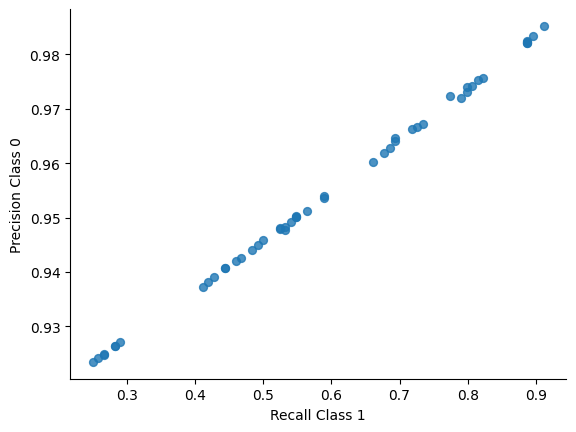

In [ ]:
from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Recall Class 1', y='Precision Class 0', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

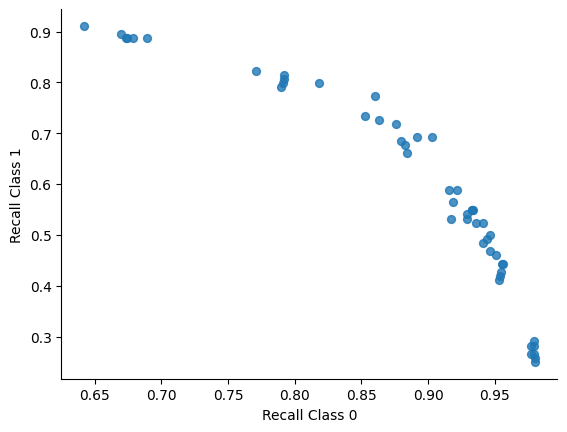

In [ ]:
from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Recall Class 0', y='Recall Class 1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

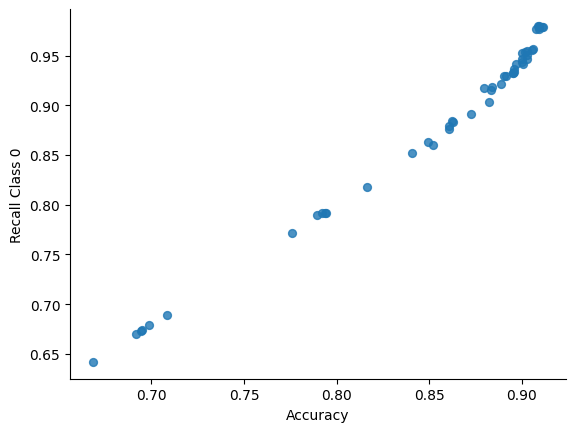

In [ ]:
from matplotlib import pyplot as plt
results_df29.plot(kind='scatter', x='Accuracy', y='Recall Class 0', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

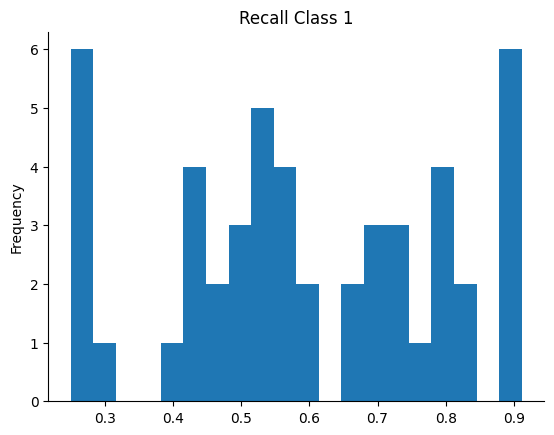

In [ ]:
from matplotlib import pyplot as plt
results_df29['Recall Class 1'].plot(kind='hist', bins=20, title='Recall Class 1')
plt.gca().spines[['top', 'right',]].set_visible(False)

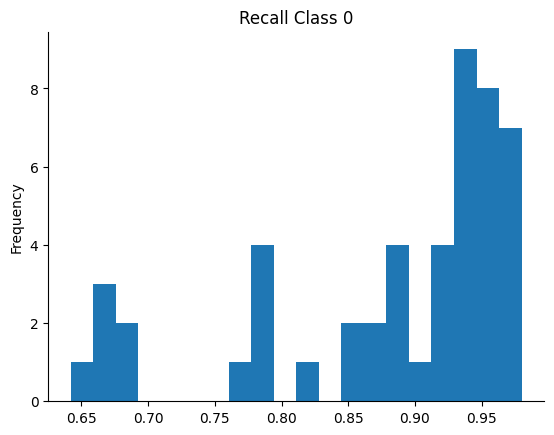

In [ ]:
from matplotlib import pyplot as plt
results_df29['Recall Class 0'].plot(kind='hist', bins=20, title='Recall Class 0')
plt.gca().spines[['top', 'right',]].set_visible(False)

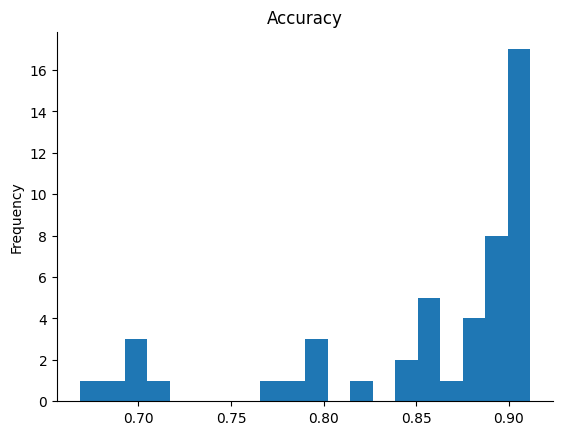

In [ ]:
from matplotlib import pyplot as plt
results_df29['Accuracy'].plot(kind='hist', bins=20, title='Accuracy')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
target_columns = ['Q27', 'Q28', 'Q29']

# Prepare the features (excluding the target columns)
X = df13.drop(target_columns, axis=1)
y=df13['Q29']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

train_df_271 = pd.concat([X_train, y_train], axis=1)

In [ ]:
from sklearn.metrics import roc_auc_score

from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, fbeta_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# Assuming train_df_271, X_test, and y_test are defined
binary_columns = [col for col in train_df_271.columns if train_df_271[col].nunique() == 2 and col != 'Q29']
X = train_df_271.drop('Q29', axis=1)
y = train_df_271['Q29']

# Define different sampling strategies and class weights to try
sampling_strategies = [0.5]
class_weight_options = [ {0: 1, 1: 5}]

# Logistic Regression hyperparameters to tune
param_grid = {
    'C': [0.01],
    'solver': ['lbfgs']
}

# Number of features to select
num_features = 60  # Adjust this based on your requirement

# List to store results
results = []

for strategy in sampling_strategies:
    for class_weights in class_weight_options:
        print(f"\nSampling Strategy: {strategy}, Class Weights: {class_weights}")

        # Apply SMOTE with the current sampling strategy
        smote = SMOTE(sampling_strategy=strategy)
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Update binary columns in resampled data
        X_resampled_binary = X_resampled[binary_columns]
        X_resampled_binary = (X_resampled_binary > 0.5).astype(int)
        X_resampled.update(X_resampled_binary)

        # Apply RFE for feature selection
        estimator = LogisticRegression(random_state=42, class_weight=class_weights)
        selector = RFE(estimator, n_features_to_select=num_features)
        X_resampled_selected = selector.fit_transform(X_resampled, y_resampled)

        # Initialize and tune Logistic Regression with GridSearchCV
        clf = GridSearchCV(estimator, param_grid, scoring='f1')
        clf.fit(X_resampled_selected, y_resampled)

        # Best hyperparameters
        best_params = clf.best_params_
        print(f"Best Hyperparameters: {best_params}")

        # Apply the same feature selection to the test set
        X_test_selected = selector.transform(X_test)

        # Evaluate the classifier
        y_pred = clf.predict(X_test_selected)
        y_pred_proba = clf.predict_proba(X_test_selected)[:, 1]
        auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)
        f2_score = fbeta_score(y_test, y_pred, beta=2, average='binary')

        # Get the classification report
        report = classification_report(y_test, y_pred, output_dict=True)

        # Get the indices of the selected features
        selected_features_indices = selector.get_support(indices=True)
        selected_features = X.columns[selected_features_indices].tolist()

        # Store the results
        results.append({
            'Sampling Strategy': strategy,
            'Class Weights': class_weights,
            'Best Parameters': best_params,
            'Selected Features': selected_features,
            'Accuracy': accuracy,
            'Recall Class 0': report['0']['recall'],
            'Recall Class 1': report['1']['recall'],
            'Precision Class 0': report['0']['precision'],
            'Precision Class 1': report['1']['precision'],
            'F1 Score Class 0': report['0']['f1-score'],
            'F1 Score Class 1': report['1']['f1-score'],
            'F2 Score': f2_score,
            'AUC': auc
        })

        # Print results
        print(f"Accuracy: {accuracy}")
        print(f"F2 Score: {f2_score}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"AUC: {auc}")
# Convert the results list to a DataFrame
results_df275 = pd.DataFrame(results)



Sampling Strategy: 0.5, Class Weights: {0: 1, 1: 5}
Best Hyperparameters: {'C': 0.01, 'solver': 'lbfgs'}
Accuracy: 0.814026792750197
F2 Score: 0.6094527363184079
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.82      0.89      1145
           1       0.32      0.79      0.45       124

    accuracy                           0.81      1269
   macro avg       0.65      0.80      0.67      1269
weighted avg       0.91      0.81      0.85      1269

AUC: 0.8793421608677279



Sampling Strategy: 0.5, Class Weights: {0: 1, 1: 5}


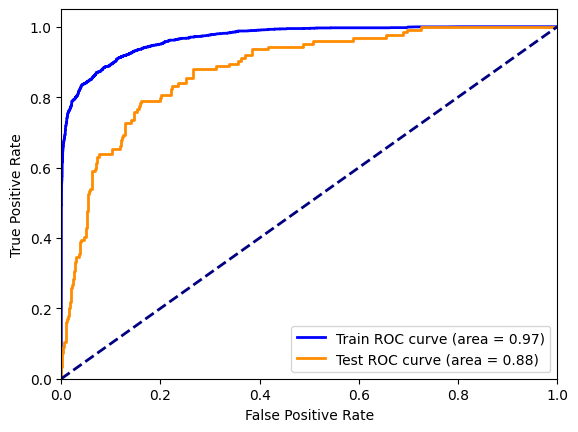

Best Hyperparameters: {'C': 0.01, 'solver': 'lbfgs'}
Accuracy: 0.8037825059101655
F2 Score: 0.5997552019583843
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.81      0.88      1145
           1       0.31      0.79      0.44       124

    accuracy                           0.80      1269
   macro avg       0.64      0.80      0.66      1269
weighted avg       0.91      0.80      0.84      1269

AUC: 0.877429919707001


In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, fbeta_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# Assuming train_df_271, X_test, and y_test are defined
binary_columns = [col for col in train_df_271.columns if train_df_271[col].nunique() == 2 and col != 'Q29']
X = train_df_271.drop('Q29', axis=1)
y = train_df_271['Q29']

# Define different sampling strategies and class weights to try
sampling_strategies = [0.5]
class_weight_options = [ {0: 1, 1: 5}]

# Logistic Regression hyperparameters to tune
param_grid = {
    'C': [0.01],
    'solver': ['lbfgs']
}


# Number of features to select
num_features = 60  # Adjust this based on your requirement

# List to store results
results = []

for strategy in sampling_strategies:
    for class_weights in class_weight_options:
        print(f"\nSampling Strategy: {strategy}, Class Weights: {class_weights}")

        # Apply SMOTE with the current sampling strategy
        smote = SMOTE(sampling_strategy=strategy)
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Update binary columns in resampled data
        X_resampled_binary = X_resampled[binary_columns]
        X_resampled_binary = (X_resampled_binary > 0.5).astype(int)
        X_resampled.update(X_resampled_binary)

        # Apply RFE for feature selection
        estimator = LogisticRegression(random_state=42, class_weight=class_weights)
        selector = RFE(estimator, n_features_to_select=num_features)
        X_resampled_selected = selector.fit_transform(X_resampled, y_resampled)

        # Initialize and tune Logistic Regression with GridSearchCV
        clf = GridSearchCV(estimator, param_grid, scoring='f1')
        clf.fit(X_resampled_selected, y_resampled)
        fpr_train, tpr_train, _ = roc_curve(y_resampled, clf.predict_proba(X_resampled_selected)[:, 1])
        auc_train = auc(fpr_train, tpr_train)

        # Calculate the false positive rate and true positive rate for the test set
        fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_proba)
        auc_test = auc(fpr_test, tpr_test)

        # Plot the ROC curves
        plt.figure()
        lw = 2
        plt.plot(fpr_train, tpr_train, color='blue',
                lw=lw, label='Train ROC curve (area = %0.2f)' % auc_train)
        plt.plot(fpr_test, tpr_test, color='darkorange',
                lw=lw, label='Test ROC curve (area = %0.2f)' % auc_test)
        plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        #plt.title('Receiver operating characteristic example')
        plt.legend(loc="lower right")
        plt.show()

        # Best hyperparameters
        best_params = clf.best_params_
        print(f"Best Hyperparameters: {best_params}")

        # Apply the same feature selection to the test set
        X_test_selected = selector.transform(X_test)

        # Evaluate the classifier
        y_pred = clf.predict(X_test_selected)
        y_pred_proba = clf.predict_proba(X_test_selected)[:, 1]
        auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)
        f2_score = fbeta_score(y_test, y_pred, beta=2, average='binary')

        # Get the classification report
        report = classification_report(y_test, y_pred, output_dict=True)

        # Get the indices of the selected features
        selected_features_indices = selector.get_support(indices=True)
        selected_features = X.columns[selected_features_indices].tolist()

        # Store the results
        results.append({
            'Sampling Strategy': strategy,
            'Class Weights': class_weights,
            'Best Parameters': best_params,
            'Selected Features': selected_features,
            'Accuracy': accuracy,
            'Recall Class 0': report['0']['recall'],
            'Recall Class 1': report['1']['recall'],
            'Precision Class 0': report['0']['precision'],
            'Precision Class 1': report['1']['precision'],
            'F1 Score Class 0': report['0']['f1-score'],
            'F1 Score Class 1': report['1']['f1-score'],
            'F2 Score': f2_score,
            'AUC': auc
        })

        # Print results
        print(f"Accuracy: {accuracy}")
        print(f"F2 Score: {f2_score}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"AUC: {auc}")
# Convert the results list to a DataFrame
results_df275 = pd.DataFrame(results)


In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 6.1 MB/s eta 0:00:00



Sampling Strategy: 0.5, Class Weights: {0: 1, 1: 5}


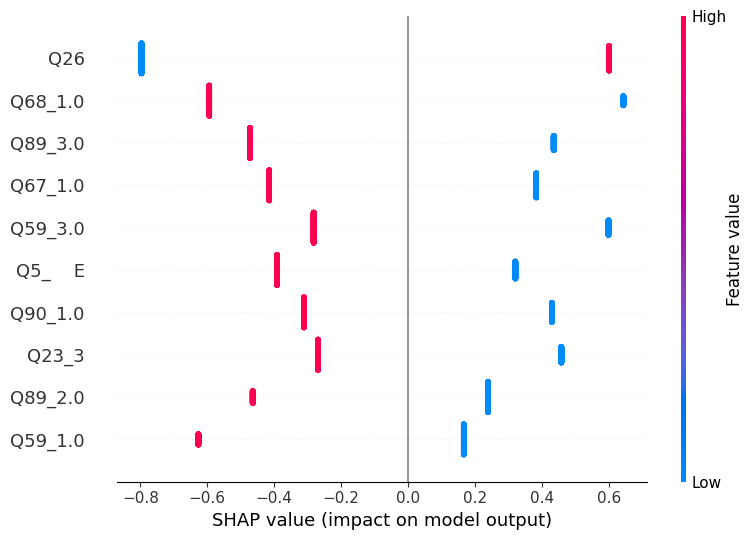

In [ ]:
# Import the necessary libraries including SHAP
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report, accuracy_score, fbeta_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np
import shap
import warnings

warnings.filterwarnings("ignore")

# Assuming train_df_271, X_test, and y_test are already defined
binary_columns = [col for col in train_df_271.columns if train_df_271[col].nunique() == 2 and col != 'Q29']
X = train_df_271.drop('Q29', axis=1)
y = train_df_271['Q29']

# Define different sampling strategies and class weights to try
sampling_strategies = [0.5]
class_weight_options = [ {0: 1, 1: 5}]

# Logistic Regression hyperparameters to tune
param_grid = {
    'C': [0.01],
    'solver': ['lbfgs']
}

# Number of features to select
num_features = 60  # Adjust this based on your requirement

# List to store results
results = []

for strategy in sampling_strategies:
    for class_weights in class_weight_options:
        print(f"\nSampling Strategy: {strategy}, Class Weights: {class_weights}")

        # Apply SMOTE with the current sampling strategy
        smote = SMOTE(sampling_strategy=strategy)
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Update binary columns in resampled data
        X_resampled_binary = X_resampled[binary_columns]
        X_resampled_binary = (X_resampled_binary > 0.5).astype(int)
        X_resampled.update(X_resampled_binary)

        # Apply RFE for feature selection
        estimator = LogisticRegression(random_state=42, class_weight=class_weights)
        selector = RFE(estimator, n_features_to_select=num_features)
        X_resampled_selected = selector.fit_transform(X_resampled, y_resampled)

        # Initialize and tune Logistic Regression with GridSearchCV
        clf = GridSearchCV(estimator, param_grid, scoring='f1')
        clf.fit(X_resampled_selected, y_resampled)

        # Best hyperparameters
        best_params = clf.best_params_

        # Apply the same feature selection to the test set
        X_test_selected = selector.transform(X_test)

        # Evaluate the classifier
        y_pred = clf.predict(X_test_selected)
        y_pred_proba = clf.predict_proba(X_test_selected)[:, 1]
        auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)
        f2_score = fbeta_score(y_test, y_pred, beta=2)

        # Get the classification report
        report = classification_report(y_test, y_pred, output_dict=True)

        # Get the indices of the selected features
        selected_features_indices = selector.get_support(indices=True)
        selected_features = X.columns[selected_features_indices].tolist()



        # Initialize the SHAP Explainer with the best estimator from GridSearchCV
        explainer = shap.Explainer(clf.best_estimator_, X_resampled_selected)

        # Compute SHAP values for the test set
        shap_values = explainer(X_test_selected)

        # Identify the top 10 features based on the mean absolute SHAP values
        top_inds = np.argsort(-np.abs(shap_values.values).mean(0))[:10]
        top_feature_names = np.array(selected_features)[top_inds]

        # Plot SHAP values for the top 10 features with dot plot
        shap.summary_plot(shap_values[:, top_inds], X_test_selected[:, top_inds], feature_names=top_feature_names, plot_type='dot')
        #shap.summary_plot(shap_values[:, top_inds], X_test_selected[:, top_inds])
        # For individual predictions, you can visualize the explanation for the first prediction
        shap.initjs()  # Necessary to use SHAP in Jupyter notebooks for visualization


# Convert the results list to a DataFrame
results_df = pd.DataFrame(results)

# Now you can use results_df for further analysis or export it to a CSV file
# results_df.to_csv('model_results.csv', index=False)


In [ ]:
import pandas as pd
import numpy as np
import re
from google.colab import files
uploaded=files.upload()

Saving result29.csv to result29.csv


In [ ]:
import io
result_df29= pd.read_csv(io.BytesIO(uploaded['result29.csv']))

In [ ]:
result_df29

,Sampling Strategy,Class Weights,Best Parameters,Selected Features,Accuracy,Recall Class 0,Recall Class 1,Precision Class 0,Precision Class 1,F1 Score Class 0,F1 Score Class 1,F2 Score,AUC
0,0.5000,"{0: 1, 1: 1}","{'C': 100, 'solver': 'liblinear'}","['Q6', 'Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E',...",0.907801,0.977293,0.266129,0.924793,0.559322,0.950318,0.360656,0.297297,0.887893
1,0.5000,"{0: 1, 1: 2}","{'C': 0.01, 'solver': 'lbfgs'}","['Q6', 'Q19', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.891253,0.929258,0.540323,0.949153,0.452703,0.939100,0.492647,0.520186,0.875838
2,0.5000,"{0: 1, 1: 2.5}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q60', 'Q98', 'Q5_ E'...",0.882585,0.903057,0.693548,0.964552,0.436548,0.932792,0.535826,0.620491,0.877560
3,0.5000,"{0: 1, 1: 3}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.860520,0.879476,0.685484,0.962715,0.381166,0.919215,0.489914,0.591099,0.881223
4,0.5000,"{0: 1, 1: 3.5}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.849488,0.862882,0.725806,0.966732,0.364372,0.911860,0.485175,0.605653,0.881149
5,0.5000,"{0: 1, 1: 5}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.816391,0.818341,0.798387,0.974012,0.322476,0.889416,0.459397,0.616438,0.881152
6,0.5000,"{0: 1, 1: 10}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.708432,0.689083,0.887097,0.982565,0.236052,0.810062,0.372881,0.571726,0.880187
7,0.6000,"{0: 1, 1: 1}","{'C': 100, 'solver': 'liblinear'}","['Q19', 'Q26', 'Q98', 'Q5_ E', 'Q5_ D', '...",0.910954,0.979039,0.282258,0.926446,0.593220,0.952017,0.382514,0.315315,0.884202
8,0.6000,"{0: 1, 1: 2}","{'C': 100, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.905437,0.955459,0.443548,0.940671,0.518868,0.948007,0.478261,0.456811,0.885054
9,0.6000,"{0: 1, 1: 2.5}","{'C': 0.01, 'solver': 'lbfgs'}","['Q19', 'Q24', 'Q26', 'Q98', 'Q5_ E', 'Q5_ ...",0.872340,0.891703,0.693548,0.964117,0.409524,0.926497,0.514970,0.609065,0.875553


In [ ]:
import plotly.graph_objects as go

# Categories to plot
categories = ['Accuracy', 'F1 Score Class 0', 'F1 Score Class 1', 'Recall Class 0', 'Recall Class 1']

# Data for each model/trace
data = {
    'Best Accuracy': [0.91,0.95,0.39,0.98,0.29],
    'Best Recall Class 0': [0.91,0.95,0.36,0.98,0.26],
    'Best Recall Class 1': [0.67,0.78,0.35,0.64,0.91],
    'Balanced Model': [0.82,0.89,0.46,0.82,0.80],
    'Real Data-Base Model': [0.92,0.96,0.47,0.98,0.37]
}

# Create the radar chart with no fill and lines connected
fig = go.Figure()

# Add each trace
for model, values in data.items():
    if model == 'Balanced Model':
        fig.add_trace(go.Scatterpolar(
            r=values + [values[0]],  # Repeat the first value at the end to close the radar chart
            theta=categories + [categories[0]],  # Repeat the first category at the end to close the radar chart
            fill='none',  # Ensure the area is not filled
            name=model,
            line=dict(width=3, dash='dash'),  # Make the line for Balanced Model thicker and dashed
            marker=dict(size=6)  # Increase the size of the markers for Balanced Model
        ))
    else:
        fig.add_trace(go.Scatterpolar(
            r=values + [values[0]],
            theta=categories + [categories[0]],
            fill='none',
            name=model
        ))

# Update the layout of the plot
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]
        )
    ),
    showlegend=True,
    legend=dict(
        orientation="v",  # Change to "h" for horizontal if needed
        xanchor="center",
        x=0.5,  # Center the legend on the x-axis
        yanchor="bottom",
        y=1.05 # Adjust the position of the legend
    ),
    paper_bgcolor='white',  # Set the overall background color to white
    plot_bgcolor='white',  # Set the plot background color to white
)

# Show the plot
fig.show()


# ***COPULA***

In [ ]:
pip install sdv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.2/143.2 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.7/170.7 kB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 12.1 MB/s eta 0:00:00


In [ ]:
majority_class = train_df_27[train_df_27['Q29'] == 0]  # if it's stored as string
minority_class = train_df_27[train_df_27['Q29'] == 1]

In [ ]:
from sdv.metadata import SingleTableMetadata


from sklearn.metrics import classification_report
from sdv.single_table import GaussianCopulaSynthesizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import warnings
# Assuming metadata is already defined


warnings.filterwarnings("ignore")

# Lists to store results for each classifier
metrics = ['recall', 'precision', 'f1-score', 'accuracy']
classifiers = ['DecisionTree', 'RandomForest', 'SVM', 'LogisticRegression','KNN','XGBoost']
results = {clf: {metric: [] for metric in metrics} for clf in classifiers}
# Dictionary to store recall scores of class 1 for each classifier
recall_scores_class_1 = {
    'DecisionTree': [],
    'RandomForest': [],
    'SVM': [],
    'LogisticRegression': [],
    'KNN': [],
    'XGBoost': []
}

metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=minority_class)
# Run the process 25 times
for _ in range(1):

    synthesizer = GaussianCopulaSynthesizer(metadata)
    synthesizer.fit(minority_class)
    # Generate synthetic data
    synthetic_data_c = synthesizer.sample(num_rows=2650)
    generated_df = pd.DataFrame(data=synthetic_data_c, columns=minority_class.columns)

    # Concatenate synthetic data with original data
    df11 = pd.concat([train_df_27, generated_df], ignore_index=True)

    # Prepare features and target variable
    X = df11.drop('Q29', axis=1)
    y = df11['Q29']


    # Initialize classifiers
    classifiers = {
        'DecisionTree': DecisionTreeClassifier(random_state=42),
        'RandomForest': RandomForestClassifier(random_state=42),
        'SVM': SVC(random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42),
        'KNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(random_state=42)
    }

    for name, clf in classifiers.items():
        # Fit classifier
        clf.fit(X, y)

        # Evaluate classifier
        y_pred = clf.predict(X_test_normalized)
        report = classification_report(y_test_Q27, y_pred, output_dict=True)
        # Store metrics
        results[name]['recall'].append(report['weighted avg']['recall'])
        results[name]['precision'].append(report['weighted avg']['precision'])
        results[name]['f1-score'].append(report['weighted avg']['f1-score'])
        results[name]['accuracy'].append(accuracy_score(y_test_Q27, y_pred))
        # Store recall score of class 1
        recall_scores_class_1[name].append(report['1']['recall'])

# Now, recall_scores_class_1 dictionary contains the recall scores of class 1 for all models


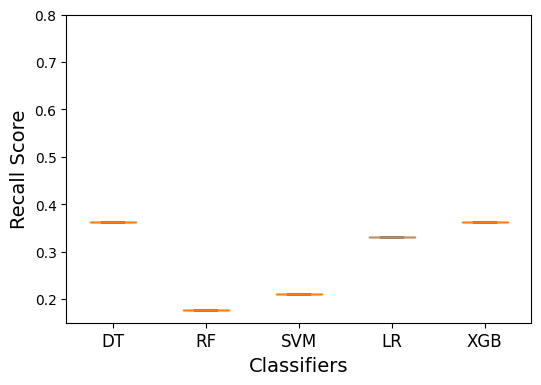

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
        recall_scores_class_1['XGBoost']]

# Creating the boxplot
bp = ax.boxplot(data, patch_artist=True)

# Coloring the boxes blue
for box in bp['boxes']:
    box.set(facecolor='red')

# Setting the labels for each boxplot
ax.set_xticklabels(['DT', 'RF', 'SVM', 'LR', 'XGB'], fontsize=12)
ax.set_ylabel('Recall Score', fontsize=14)
ax.set_xlabel('Classifiers', fontsize=14)

# Setting y-axis limits and tick marks
ax.set_ylim(0.15, 0.80)
#ax.set_yticks([i * 0.2 for i in range(6)])

# Show the plot
plt.show()

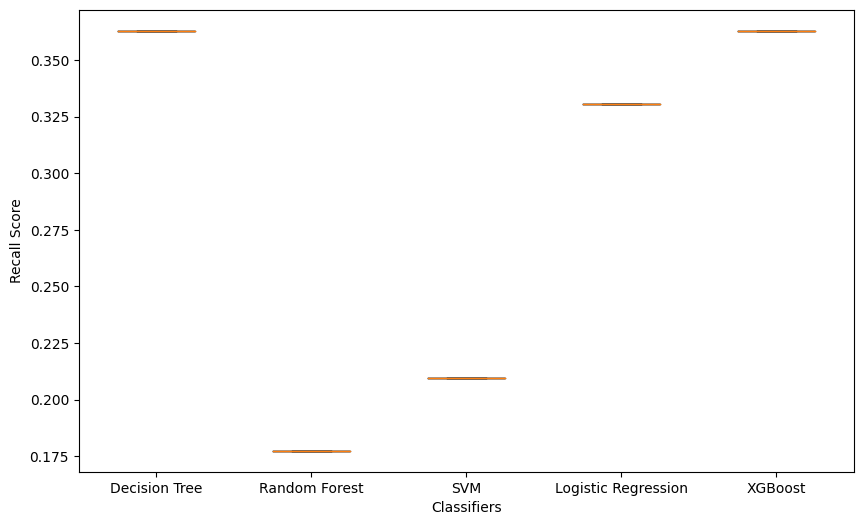

In [ ]:
import matplotlib.pyplot as plt

# Plotting the recall scores for class 1
fig, ax = plt.subplots(figsize=(10, 6))

# Data for plotting
data = [recall_scores_class_1['DecisionTree'],
        recall_scores_class_1['RandomForest'],
        recall_scores_class_1['SVM'],
        recall_scores_class_1['LogisticRegression'],
         #recall_scores_class_1['KNN'],
         recall_scores_class_1['XGBoost']]

# Creating the boxplot
ax.boxplot(data)

# Setting the labels for each boxplot
ax.set_xticklabels(['Decision Tree', 'Random Forest', 'SVM', 'Logistic Regression','XGBoost'])
#ax.set_title('Recall Scores of Class 1 for Each Classifier')
ax.set_ylabel('Recall Score')
ax.set_xlabel('Classifiers')


ax.grid(False)
plt.savefig("recall_classs1_copula.pdf", dpi=300, bbox_inches='tight')
# Show the plot
plt.show()


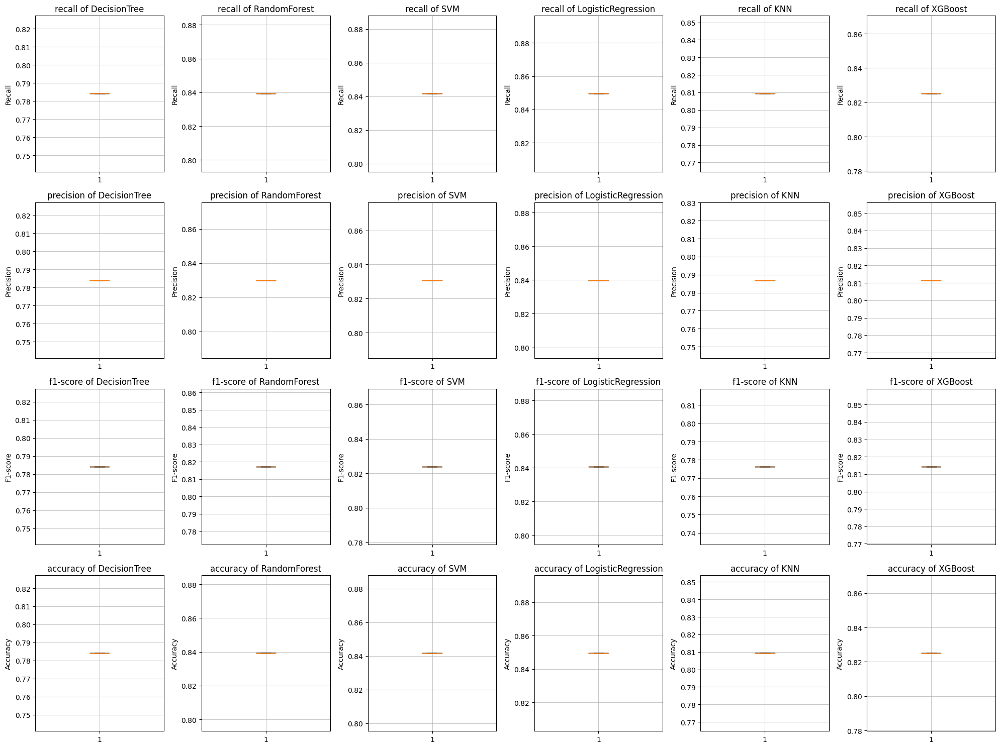

In [ ]:
fig, axes = plt.subplots(len(metrics), len(classifiers), figsize=(20, 15))
for i, metric in enumerate(metrics):
    for j, clf in enumerate(classifiers):
        axes[i, j].boxplot(results[clf][metric])
        axes[i, j].set_title(f'{metric} of {clf}')
        axes[i, j].set_ylabel(metric.capitalize())

# Adding grids to all subplots
for ax in axes.flatten():
    ax.grid(True, linestyle='-', alpha=0.7)

plt.tight_layout()
plt.show()
